# Understanding the Problem Statement & Business Case

- Artificial Intelligence (AI), Machine Learning (ML) and Deep Learning (DL) have been transforming finance and investing.
- "Artificial intelligence is to trading what fire was to the cavemen"!
- Electronic trades account for almost 45% of revenues in cash equities trading"
- AI powered robo-advisers can perform real-time analysis on massive datasets and trade securities at an extremely faster rate compared to human traders.
- AI-powered trading could potentially reduce risk and maximize returns.
- In this project, I trained a ridge regression model and deep neural network model to predict future stock prices.
- By accurately predicting stock prices, investors can maximize returns and know when to buy/sell securities.
- The AI/ML model will be trained using historical stock price data along with the volume of transactions.
- We will use a type of neural nets known as Long Short-Term Memory Networks (LSTM).
- Disclaimer: Stock prices are volatile and are generally hard to predict. Invest at your own risk.

# Import Datasets and Libraries

In [1]:
import pandas as pd
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler
from tensorflow import keras

In [2]:
# Read stock prices data
stock_price_df = pd.read_csv("D:\Python and Machine Learning for Financial Analysis\stock.csv")
stock_price_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [3]:
# Read the stocks volume data
stock_vol_df = pd.read_csv("D:\Python and Machine Learning for Financial Analysis\stock_volume.csv")
stock_vol_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,53146800,3934500,26511100,17891100,5385800,6881000,729300,3764400,4019890000
1,2012-01-13,56505400,4641100,22096800,16621800,4753500,5279200,5500400,4631800,3692370000
2,2012-01-17,60724300,3700100,23500200,15480800,5644500,6003400,4651600,3832800,4010490000
3,2012-01-18,69197800,4189500,22015000,18387600,7473500,4600600,1260200,5544000,4096160000
4,2012-01-19,65434600,5397300,25524000,14022900,7096000,8567200,1246300,12657800,4465890000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,30498000,46551000,22991700,18914200,3930000,3675400,4978000,1979500,4732220000
2155,2020-08-06,50607200,32921600,21908700,35867700,3940600,3417100,5992300,1995400,4267490000
2156,2020-08-07,49453300,19301600,30398500,34530300,3929600,3651000,8883500,1576600,4104860000
2157,2020-08-10,53100900,35857700,35514400,71219700,3167300,3968300,7522300,1289300,4318570000


In [4]:
# Sorted the data based on Date
stock_price_df = stock_price_df.sort_values(by = ['Date'])
stock_price_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


In [5]:
# Sorted the data based on Date
stock_vol_df = stock_vol_df.sort_values(by = ['Date'])
stock_vol_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,53146800,3934500,26511100,17891100,5385800,6881000,729300,3764400,4019890000
1,2012-01-13,56505400,4641100,22096800,16621800,4753500,5279200,5500400,4631800,3692370000
2,2012-01-17,60724300,3700100,23500200,15480800,5644500,6003400,4651600,3832800,4010490000
3,2012-01-18,69197800,4189500,22015000,18387600,7473500,4600600,1260200,5544000,4096160000
4,2012-01-19,65434600,5397300,25524000,14022900,7096000,8567200,1246300,12657800,4465890000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,30498000,46551000,22991700,18914200,3930000,3675400,4978000,1979500,4732220000
2155,2020-08-06,50607200,32921600,21908700,35867700,3940600,3417100,5992300,1995400,4267490000
2156,2020-08-07,49453300,19301600,30398500,34530300,3929600,3651000,8883500,1576600,4104860000
2157,2020-08-10,53100900,35857700,35514400,71219700,3167300,3968300,7522300,1289300,4318570000


In [6]:
# Checked if Null values exist in stock prices data
stock_price_df.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

In [7]:
# Checked if Null values exist in stocks volume data
stock_vol_df.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

In [8]:
# Got stock prices dataframe info
stock_price_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2159 non-null   object 
 1   AAPL    2159 non-null   float64
 2   BA      2159 non-null   float64
 3   T       2159 non-null   float64
 4   MGM     2159 non-null   float64
 5   AMZN    2159 non-null   float64
 6   IBM     2159 non-null   float64
 7   TSLA    2159 non-null   float64
 8   GOOG    2159 non-null   float64
 9   sp500   2159 non-null   float64
dtypes: float64(9), object(1)
memory usage: 185.5+ KB


In [9]:
# Got stock volume dataframe info
stock_vol_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    2159 non-null   object
 1   AAPL    2159 non-null   int64 
 2   BA      2159 non-null   int64 
 3   T       2159 non-null   int64 
 4   MGM     2159 non-null   int64 
 5   AMZN    2159 non-null   int64 
 6   IBM     2159 non-null   int64 
 7   TSLA    2159 non-null   int64 
 8   GOOG    2159 non-null   int64 
 9   sp500   2159 non-null   int64 
dtypes: int64(9), object(1)
memory usage: 185.5+ KB


In [10]:
# Got the statistical data for the stocks volume dataframe
stock_vol_df.describe()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03,2.159000e+03
mean,5.820332e+07,6.419916e+06,2.832131e+07,9.845582e+06,4.102673e+06,4.453090e+06,7.001302e+06,2.498238e+06,3.680732e+09
std,4.568141e+07,9.711873e+06,1.428911e+07,7.295753e+06,2.290722e+06,2.462811e+06,5.781208e+06,1.928407e+06,8.622717e+08
min,1.136200e+07,7.889000e+05,6.862400e+06,9.507000e+05,8.813000e+05,1.193000e+06,3.649000e+05,7.900000e+03,1.248960e+09
25%,2.769930e+07,3.031850e+06,2.002150e+07,5.796450e+06,2.675700e+06,3.111250e+06,3.433450e+06,1.325400e+06,3.211890e+09
50%,4.209420e+07,3.991000e+06,2.485930e+07,7.899800e+06,3.494800e+06,3.825000e+06,5.581100e+06,1.813900e+06,3.526890e+09
75%,7.182480e+07,5.325900e+06,3.210565e+07,1.104055e+07,4.768150e+06,4.937300e+06,8.619550e+06,3.245350e+06,3.933290e+09
max,3.765300e+08,1.032128e+08,1.950827e+08,9.009820e+07,2.385610e+07,3.049020e+07,6.093880e+07,2.497790e+07,9.044690e+09


- Average trading volume for Apple stock is 5.820332e+07

- Maximum trading volume for S&P500 is 9.044690e+09

- S&P500 is the most traded security of them all.
- The S&P 500 index is a broad-based measure of large corporations traded on U.S. stock markets. Over long periods of time, passively holding the index often produces better results than actively trading or picking single stocks.
- Over long-time horizons, the index typically produces better returns than actively managed portfolios.

In [11]:
# Got the statistical data for the prices dataframe
stock_price_df.describe()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000
mean,140.819823,189.942700,35.162899,23.105743,915.665665,161.853001,259.600815,783.712512,2218.749554
std,70.827601,103.678586,3.207490,6.963847,697.838905,25.561938,210.988003,334.448057,537.321727
min,55.790001,67.239998,26.770000,7.140000,175.929993,94.769997,22.790001,278.481171,1278.040039
25%,89.165714,124.015000,33.040001,18.545000,316.490005,142.769997,184.595001,527.214416,1847.984985
50%,116.599998,142.419998,34.930000,23.780001,676.010010,156.949997,231.960007,737.599976,2106.629883
75%,175.019997,297.044998,37.419998,28.430000,1593.645019,185.974998,307.350006,1079.744995,2705.810059
max,455.609985,440.619995,43.470001,38.029999,3225.000000,215.800003,1643.000000,1568.489990,3386.149902


- Average Stock Price for S&P500 = 2218.749554
- Maximum Tesla Stock Price = 1643.000000

# Performed Exploratory Data Analysis and Visualization

In [12]:
# Function to normalize stock prices based on their initial price
def normalize(df):
  x = df.copy()
  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

In [13]:
# Function to plot interactive plots using Plotly Express
def interactive_plot(df, title):
  fig = px.line(title = title)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['Date'], y = df[i], name = i)
  fig.show()

In [14]:
# Plotted interactive chart for stocks data
interactive_plot(stock_price_df, 'Stock Prices')

In [15]:
# Plotted interactive chart for volume data
# Noticed that S&P500 trading is orders of magnitude compared to individual stocks
interactive_plot(stock_vol_df, 'Stocks Volume')

In [16]:
# Plotted interactive chart for normalized stocks prices data
interactive_plot(normalize(stock_price_df), 'Stock Prices')

# Let's normalize the data and re-plot interactive chart for volume data
interactive_plot(normalize(stock_vol_df), 'Normalized Volume')

# Prepared the Data before Training the AI/ML Model

## Training & Testing Data Split

+ Data set is divided into 75% for training and 25% for testing.
    - Training set: used for model training.
    - Testing set: used for testing trained model. Made sure that the testing dataset has never been seen by the trained model before.

In [17]:
# Function to concatenate the date, stock price, and volume in one dataframe
def individual_stock(price_df, vol_df, name):
    return pd.DataFrame({'Date': price_df['Date'], 'Close': price_df[name], 'Volume': vol_df[name]})

In [18]:
# Function to return the input/output (target) data for AI/ML Model
# Noted that our goal is to predict the future stock price 
# Target stock price today will be tomorrow's price 
def trading_window(data):
  
  # 1 day window 
  n = 1

  # Created a column containing the prices for the next 1 days
  data['Target'] = data[['Close']].shift(-n)
  
  # Returned the new dataset 
  return data

In [19]:
# Let's test the functions and get individual stock prices and volumes for AAPL
price_volume_df = individual_stock(stock_price_df, stock_vol_df, 'AAPL')
price_volume_df

,Date,Close,Volume
0,2012-01-12,60.198570,53146800
1,2012-01-13,59.972858,56505400
2,2012-01-17,60.671429,60724300
3,2012-01-18,61.301430,69197800
4,2012-01-19,61.107143,65434600
...,...,...,...
2154,2020-08-05,440.250000,30498000
2155,2020-08-06,455.609985,50607200
2156,2020-08-07,444.450012,49453300
2157,2020-08-10,450.910004,53100900


In [20]:
price_volume_target_df = trading_window(price_volume_df)
price_volume_target_df

,Date,Close,Volume,Target
0,2012-01-12,60.198570,53146800,59.972858
1,2012-01-13,59.972858,56505400,60.671429
2,2012-01-17,60.671429,60724300,61.301430
3,2012-01-18,61.301430,69197800,61.107143
4,2012-01-19,61.107143,65434600,60.042858
...,...,...,...,...
2154,2020-08-05,440.250000,30498000,455.609985
2155,2020-08-06,455.609985,50607200,444.450012
2156,2020-08-07,444.450012,49453300,450.910004
2157,2020-08-10,450.910004,53100900,437.500000


In [21]:
# Removed the last row as it will be a null value
price_volume_target_df = price_volume_target_df[:-1]
price_volume_target_df

,Date,Close,Volume,Target
0,2012-01-12,60.198570,53146800,59.972858
1,2012-01-13,59.972858,56505400,60.671429
2,2012-01-17,60.671429,60724300,61.301430
3,2012-01-18,61.301430,69197800,61.107143
4,2012-01-19,61.107143,65434600,60.042858
...,...,...,...,...
2153,2020-08-04,438.660004,43267900,440.250000
2154,2020-08-05,440.250000,30498000,455.609985
2155,2020-08-06,455.609985,50607200,444.450012
2156,2020-08-07,444.450012,49453300,450.910004


In [22]:
# Scaled the data
sc = MinMaxScaler(feature_range = (0, 1))
price_volume_target_scaled_df = sc.fit_transform(price_volume_target_df.drop(columns = ['Date']))

In [23]:
price_volume_target_scaled_df

array([[0.01102638, 0.11442624, 0.01046185],
       [0.01046185, 0.12362365, 0.01220906],
       [0.01220906, 0.13517696, 0.01378478],
       ...,
       [1.        , 0.10747163, 0.97208751],
       [0.97208751, 0.10431171, 0.98824476],
       [0.98824476, 0.11430054, 0.95470465]])

In [24]:
price_volume_target_scaled_df.shape

(2158, 3)

In [25]:
# Created Feature and Target
X = price_volume_target_scaled_df[:,:2]
y = price_volume_target_scaled_df[:,2:]

In [26]:
# Converted dataframe to arrays
# X = np.asarray(X)
# y = np.asarray(y)
X.shape, y.shape

((2158, 2), (2158, 1))

In [27]:
# Split the data this way, since order is important in time-series
# Noted that we did not use train test split with it's default settings since it shuffles the data
split = int(0.65 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

In [28]:
X_train.shape, y_train.shape

((1402, 2), (1402, 1))

In [29]:
X_test.shape, y_test.shape

((756, 2), (756, 1))

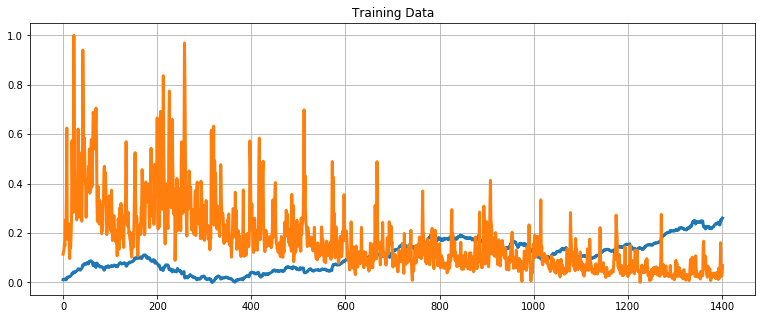

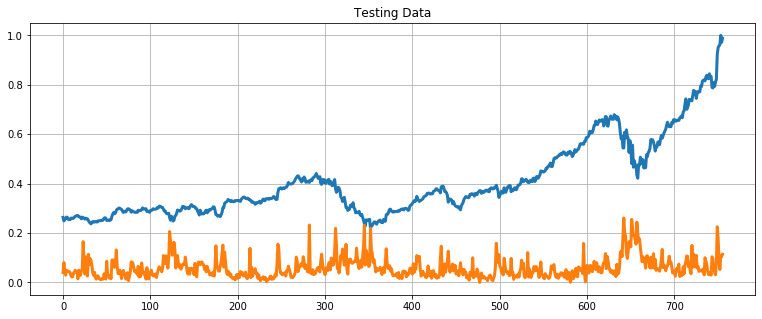

In [30]:
# Defined a data plotting function
def show_plot(data, title):
  plt.figure(figsize = (13, 5))
  plt.plot(data, linewidth = 3)
  plt.title(title)
  plt.grid()

show_plot(X_train, 'Training Data')
show_plot(X_test, 'Testing Data')

In [31]:
# Let's test the functions and get individual stock prices and volumes for S&P500
price_volume_df = individual_stock(stock_price_df, stock_vol_df, 'sp500')
price_volume_df

,Date,Close,Volume
0,2012-01-12,1295.500000,4019890000
1,2012-01-13,1289.089966,3692370000
2,2012-01-17,1293.670044,4010490000
3,2012-01-18,1308.040039,4096160000
4,2012-01-19,1314.500000,4465890000
...,...,...,...
2154,2020-08-05,3327.770020,4732220000
2155,2020-08-06,3349.159912,4267490000
2156,2020-08-07,3351.280029,4104860000
2157,2020-08-10,3360.469971,4318570000


In [32]:
# Let's test the functions and get individual stock prices and volumes for Amazon 
price_volume_df = individual_stock(stock_price_df, stock_vol_df, 'AMZN')
price_volume_df

,Date,Close,Volume
0,2012-01-12,175.929993,5385800
1,2012-01-13,178.419998,4753500
2,2012-01-17,181.660004,5644500
3,2012-01-18,189.440002,7473500
4,2012-01-19,194.449997,7096000
...,...,...,...
2154,2020-08-05,3205.030029,3930000
2155,2020-08-06,3225.000000,3940600
2156,2020-08-07,3167.459961,3929600
2157,2020-08-10,3148.159912,3167300


# Understanding the Theory and Intuition behind Regression

## Simple Linear Regression: Intuition

- In simple linear regression, we predict the value of one variable Y based on another variable X.
- X is called the independent variable and Y is called the dependant variable.
- It is called simple because it examines relationship between two variables only.
- It is called linear as when the independent variable increases (or decreases), the dependent variable increases (or decreases) in a linear fashion.

## M and B

- Once the coefficients m and b are obtained, you have obtained a simple linear regression model!
- This "trained" model can be later used to predict.

## Simple Linear Regression: To Obtain Model Parameters using Least Sum of Squares

- Least squares fitting is a way to find the best fit curve or line for a set of points.
- The sum of the squares of the offsets (residuals) are used to estimate the best fit curve or line.
- Least squares method is used to obtain the coefficients m and b.

# Understanding the Concept of Regularization & Ridge Regression

## Regularization: Intuition

- Regularization techniques are used to avoid networks overfitting
- Overfitting occurs when the model provide great results on the training data but performs poorly on testing dataset.
- Overfitting occurs when the model learns all the patterns of the training dataset but fails to generalize.
- Overfitted models generally provide high accuracy on training dataset but low accuracy on testing and validation (evaluation) datasets

## Ridge Regression (L2 Regularization): Intuition

- Ridge regression advantage is to avoid overfitting.
- Our ultimate model is the one that could generalize patterns; i.e.: works best on the training and testing dataset
- Overfitting occurs when the trained model performs well on the training data and performs poorly on the testing datasets
- Ridge regression works by applying a penalizing term (reducing the weights and biases) to overcome overfitting.
- Ridge regression works by attempting at increasing the bias to improve variance (generalization capability)
- This works by changing the slope of the line
- The model performance might become little poor on the training set but it will perform consistently well on both the training and testing datasets.

## Ridge Regression (L2 Regularization): Math

- Slope when reduced with the ridge regression penalty makes the model become less sensitive to changes in the independent variable

## Ridge Regression (L2 Regularization): Alpha Effect

- As Alpha increases, the slope of the regression line reduces and becomes more horizontal.
- As Alpha increases, the model becomes less sensitive to the variations of the independent variable

# Built and Trained a Ridge Linear Regression Model

In [33]:
# Noted that Ridge regression performs linear least squares with L2 regularization.
# Created and trained the Ridge Linear Regression  Model
regression_model = Ridge()
regression_model.fit(X_train, y_train)

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [34]:
# Tested the model and calculated its accuracy 
lr_accuracy = regression_model.score(X_test, y_test)
print("Linear Regression Score: ", lr_accuracy)

Linear Regression Score:  0.7950028030821767


In [35]:
# Made Prediction
predicted_prices = regression_model.predict(X)
predicted_prices

array([[0.03466412],
       [0.03374627],
       [0.03451936],
       ...,
       [0.81048342],
       [0.78876033],
       [0.80091324]])

In [36]:
# Append the predicted values into a list
Predicted = []
for i in predicted_prices:
  Predicted.append(i[0])

In [37]:
len(Predicted)

2158

In [38]:
# Append the close values to the list
close = []
for i in price_volume_target_scaled_df:
  close.append(i[0])

In [39]:
# Created a dataframe based on the dates in the individual stock data
df_predicted = price_volume_target_df[['Date']]
df_predicted

,Date
0,2012-01-12
1,2012-01-13
2,2012-01-17
3,2012-01-18
4,2012-01-19
...,...
2153,2020-08-04
2154,2020-08-05
2155,2020-08-06
2156,2020-08-07


In [40]:
# Added the close values to the dataframe
df_predicted['Close'] = close
df_predicted

,Date,Close
0,2012-01-12,0.011026
1,2012-01-13,0.010462
2,2012-01-17,0.012209
3,2012-01-18,0.013785
4,2012-01-19,0.013299
...,...,...
2153,2020-08-04,0.957606
2154,2020-08-05,0.961583
2155,2020-08-06,1.000000
2156,2020-08-07,0.972088


In [41]:
# Added the predicted values to the dataframe
df_predicted['Prediction'] = Predicted
df_predicted

,Date,Close,Prediction
0,2012-01-12,0.011026,0.034664
1,2012-01-13,0.010462,0.033746
2,2012-01-17,0.012209,0.034519
3,2012-01-18,0.013785,0.034556
4,2012-01-19,0.013299,0.034707
...,...,...,...
2153,2020-08-04,0.957606,0.778280
2154,2020-08-05,0.961583,0.783205
2155,2020-08-06,1.000000,0.810483
2156,2020-08-07,0.972088,0.788760


In [42]:
# Plotted the results
interactive_plot(df_predicted, "Original Vs. Prediction")

In [43]:
# Noted that Ridge regression performs linear least squares with L2 regularization.
# Created and trained the Ridge Linear Regression  Model
regression_model_2 = Ridge(alpha = 2)
regression_model_2.fit(X_train, y_train)

# Tested the model and calculated its accuracy 
lr_accuracy = regression_model_2.score(X_test, y_test)
print("Linear Regression Score: ", lr_accuracy)

# Made Prediction
predicted_prices = regression_model_2.predict(X)
predicted_prices

# Append the predicted values into a list
Predicted = []
for i in predicted_prices:
  Predicted.append(i[0])

# Append the close values to the list
close = []
for i in price_volume_target_scaled_df:
  close.append(i[0])

# Created a dataframe based on the dates in the individual stock data
df_predicted_2 = price_volume_target_df[['Date']]
df_predicted_2

# Added the close values to the dataframe
df_predicted_2['Close'] = close
df_predicted_2

# Added the predicted values to the dataframe
df_predicted_2['Prediction'] = Predicted
df_predicted_2

# Plotted the results
interactive_plot(df_predicted_2, "Original Vs. Prediction")

Linear Regression Score:  0.4710364276441908


# Understanding the Theory and Intuition behind Neural Networks

## Neuron Mathematical Model

- Artificial Neural Networks are information processing models that are inspired by the human brain.
- The neuron collects signals from input channels named dendrites, processes information in its nucleus, and then generates an output in a long thin branch called axon.

# Understanding how do Artificial Neural Networks Train

## ANN Training using Gradient Descent

- Gradient descent is an optimization algorithm used to obtain the optimized network weight and bias values.
- It works by iteratively trying to minimize the cost function.
- It works by calculating the gradient of the cost function and moving in the negative direction until the local/global minimum is achieved.
- The size of the steps taken are called the learning rate
- If learning rate increases, the area covered in the search space will increase so we might reach global minimum faster
- However, we can overshoot the target
- For small learning rates, training will take much longer to reach optimized weights values

# Understanding the Theory and Intuition behind Recurrent Neural Networks

## Recurrent Neural Networks (RNN):

- Feedforward Neural Networks (vanilla networks) map a fixed size input (such as image) to a fixed size output (classes or probabilities).
- A drawback in Feedforward networks is that they do not have any time dependency or memory effect.
- A RNN is a type of ANN that is designed to take temporal dimension into consideration by having a memory (internal state) (feedback loop).

## RNN Architecture

- A RNN contains a temporal loop in which the hidden layer not only gives an output but it feeds itself as well.
- An extra dimension is added which is time!
- RNN can recall what happened in the previous time stamp so it works great with sequence of text.

## RNNs are Special

- Feedforward ANNs are so constrained with their fixed number of input and outputs.
- For example, a CNN will have fixed size image and generates a fixed output (class or probabilities).
- Feedforward ANN have a fixed configuration, i.e.: same number of hidden layers and weights.
- Recurrent Neural Networks offer huge advantage over feedforward ANN and they are much more fun!
+ RNN allows us to work with a sequence of vectors:
    - Sequence in inputs
    - Sequence in outputs
    - Sequence in both!

## RNN Math

- A RNN accepts an input x and generate an output o.
- The output o does not depend on the input x alone, however, it depends on the entire history of the inputs that have been fed to the network in previous time steps.

# Understanding the Theory and Intuition behind Long Short Term Memory Networks

## Vanishing Gradient Problem

- LSTM networks work much better compared to vanilla RNN since they overcome the vanishing gradient problem.
- The error has to propogate through all the previous layers resulting in a vanishing gradient.
- As the gradient goes smaller, the network weights are no longer updated.
- As more layers are added, the gradients of the loss function approaches zero, making the network hard to train.
- ANN gradients are calculated during backpropagation.
- In backpropagation, we calculate the derivatives of the network by moving from the outermost layer (close to output) back to the initial layers (close to inputs).
- The chain rule is used during this calculation in which the derivatives from the final layers are multiplied by the derivaties from early layers.
- The gradients keeps diminishing exponentially and therefore the weights and biases are no longer being updated.

## LSTM Intuition

- LSTM networks work better compared to vanilla RNN since they overcome vanishing gradient problem.
- In practice, RNN fail to establish long term dependencies.
- LSTM networks are type of RNN that are designed to remember long term dependencies by default.
- LSTM can remember and recall information for a prolonged period of time.

## LSTM Intuition - Gates

- LSTM contains gates that can allow or block information passing by.
- Gates consist of a sigmoid neural net layer along with a pointwise multiplication operation.
+ Sigmoid output ranges from 0 to 1:
    - 0 = Don't allow any data to flow
    - 1 = Allow everything to flow!

# Trained an LSTM Time Series Model

In [44]:
# Let's test the functions and get individual stock prices and volumes for AAPL
price_volume_df = individual_stock(stock_price_df, stock_vol_df, 'AAPL')
price_volume_df

,Date,Close,Volume
0,2012-01-12,60.198570,53146800
1,2012-01-13,59.972858,56505400
2,2012-01-17,60.671429,60724300
3,2012-01-18,61.301430,69197800
4,2012-01-19,61.107143,65434600
...,...,...,...
2154,2020-08-05,440.250000,30498000
2155,2020-08-06,455.609985,50607200
2156,2020-08-07,444.450012,49453300
2157,2020-08-10,450.910004,53100900


In [45]:
# Got the close and volume data as training data (Input)
training_data = price_volume_df.iloc[:, 1:3].values
training_data

array([[6.01985700e+01, 5.31468000e+07],
       [5.99728580e+01, 5.65054000e+07],
       [6.06714290e+01, 6.07243000e+07],
       ...,
       [4.44450012e+02, 4.94533000e+07],
       [4.50910004e+02, 5.31009000e+07],
       [4.37500000e+02, 4.68711000e+07]])

In [46]:
# Normalized the data
sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(training_data)

In [47]:
# Created the training and testing data, training data contains present day and previous day values
X = []
y = []
for i in range(1, len(price_volume_df)):
    X.append(training_set_scaled [i-1:i, 0])
    y.append(training_set_scaled [i, 0])

In [48]:
X

[array([0.01102638]),
 array([0.01046185]),
 array([0.01220906]),
 array([0.01378478]),
 array([0.01329884]),
 array([0.01063693]),
 array([0.01317736]),
 array([0.01067623]),
 array([0.02005545]),
 array([0.01933012]),
 array([0.02027698]),
 array([0.02232433]),
 array([0.02356417]),
 array([0.02346055]),
 array([0.02307824]),
 array([0.02470754]),
 array([0.02624037]),
 array([0.02797688]),
 array([0.03078171]),
 array([0.03667365]),
 array([0.03676297]),
 array([0.04004303]),
 array([0.04249412]),
 array([0.0382815]),
 array([0.03990367]),
 array([0.03987152]),
 array([0.04442]),
 array([0.04377327]),
 array([0.04497023]),
 array([0.0471212]),
 array([0.04831818]),
 array([0.05176615]),
 array([0.054278]),
 array([0.05500331]),
 array([0.05525701]),
 array([0.05096223]),
 array([0.04992603]),
 array([0.05007968]),
 array([0.0541172]),
 array([0.05525344]),
 array([0.05769381]),
 array([0.06344641]),
 array([0.07112129]),
 array([0.06968493]),
 array([0.0696885]),
 array([0.07523743]

In [49]:
# Converted the data into array format
X = np.asarray(X)
y = np.asarray(y)

In [50]:
# Splitted the data
split = int(0.7 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

In [51]:
# Reshaped the 1D arrays to 3D arrays to feed in the model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
X_train.shape, X_test.shape

((1510, 1, 1), (648, 1, 1))

In [52]:
# Created the model
inputs = keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2]))
x = keras.layers.LSTM(150, return_sequences= True)(inputs)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150, return_sequences=True)(x)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150)(x)
outputs = keras.layers.Dense(1, activation='linear')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss="mse")
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1, 1)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 1, 150)            91200     
_________________________________________________________________
dropout (Dropout)            (None, 1, 150)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 1, 150)            180600    
_________________________________________________________________
dropout_1 (Dropout)          (None, 1, 150)            0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 150)               180600    
_________________________________________________________________
dense (Dense)                (None, 1)                 151   

In [53]:
# Trained the model
history = model.fit(
    X_train, y_train,
    epochs = 20,
    batch_size = 32,
    validation_split = 0.2
)

Epoch 1/20
38/38 [==============================] - 13s 111ms/step - loss: 0.0064 - val_loss: 0.0212
Epoch 2/20
38/38 [==============================] - 0s 12ms/step - loss: 0.0021 - val_loss: 0.0057
Epoch 3/20
38/38 [==============================] - 0s 12ms/step - loss: 5.2621e-04 - val_loss: 3.5259e-05
Epoch 4/20
38/38 [==============================] - 0s 12ms/step - loss: 4.9535e-05 - val_loss: 2.4259e-05
Epoch 5/20
38/38 [==============================] - 0s 12ms/step - loss: 5.1024e-05 - val_loss: 2.0410e-05
Epoch 6/20
38/38 [==============================] - 0s 12ms/step - loss: 4.2864e-05 - val_loss: 1.7693e-05
Epoch 7/20
38/38 [==============================] - 0s 12ms/step - loss: 3.8262e-05 - val_loss: 3.5504e-05
Epoch 8/20
38/38 [==============================] - 0s 13ms/step - loss: 3.8512e-05 - val_loss: 2.3805e-05
Epoch 9/20
38/38 [==============================] - 0s 12ms/step - loss: 3.5577e-05 - val_loss: 2.2485e-05
Epoch 10/20
38/38 [==============================] 

In [54]:
# Made prediction
predicted = model.predict(X)

In [55]:
# Append the predicted values to the list
test_predicted = []

for i in predicted:
  test_predicted.append(i[0])

In [56]:
test_predicted

[0.009663401,
 0.009108094,
 0.010826838,
 0.012377107,
 0.011898997,
 0.009280309,
 0.011779472,
 0.009318966,
 0.01854866,
 0.017834624,
 0.018766755,
 0.020782504,
 0.022003379,
 0.02190134,
 0.021524867,
 0.023129381,
 0.024639089,
 0.02634964,
 0.029113064,
 0.03492008,
 0.035008144,
 0.03824214,
 0.040659353,
 0.036505245,
 0.03810472,
 0.03807302,
 0.04255894,
 0.04192101,
 0.043101713,
 0.045223735,
 0.046404764,
 0.049807355,
 0.052286714,
 0.053002708,
 0.053253166,
 0.049013935,
 0.04799135,
 0.048142977,
 0.052127972,
 0.053249642,
 0.05565904,
 0.061340272,
 0.06892347,
 0.067503974,
 0.0675075,
 0.07299204,
 0.0747088,
 0.07348656,
 0.07237039,
 0.07120839,
 0.07506912,
 0.07771889,
 0.07882838,
 0.07608658,
 0.07244457,
 0.07918528,
 0.08296316,
 0.081192486,
 0.08450425,
 0.08540566,
 0.08265214,
 0.08186045,
 0.08064825,
 0.07445092,
 0.06558681,
 0.07603005,
 0.075549595,
 0.06816779,
 0.06306273,
 0.06261092,
 0.058580533,
 0.07613605,
 0.07532348,
 0.07366319,
 0.06

In [57]:
df_predicted = price_volume_df[1:][['Date']]
df_predicted

,Date
1,2012-01-13
2,2012-01-17
3,2012-01-18
4,2012-01-19
5,2012-01-20
...,...
2154,2020-08-05
2155,2020-08-06
2156,2020-08-07
2157,2020-08-10


In [58]:
df_predicted['predictions'] = test_predicted

In [59]:
df_predicted

,Date,predictions
1,2012-01-13,0.009663
2,2012-01-17,0.009108
3,2012-01-18,0.010827
4,2012-01-19,0.012377
5,2012-01-20,0.011899
...,...,...
2154,2020-08-05,0.926448
2155,2020-08-06,0.930025
2156,2020-08-07,0.964375
2157,2020-08-10,0.939454


In [60]:
# Plot the data
close = []
for i in training_set_scaled:
  close.append(i[0])

In [61]:
df_predicted['Close'] = close[1:]

In [62]:
df_predicted

,Date,predictions,Close
1,2012-01-13,0.009663,0.010462
2,2012-01-17,0.009108,0.012209
3,2012-01-18,0.010827,0.013785
4,2012-01-19,0.012377,0.013299
5,2012-01-20,0.011899,0.010637
...,...,...,...
2154,2020-08-05,0.926448,0.961583
2155,2020-08-06,0.930025,1.000000
2156,2020-08-07,0.964375,0.972088
2157,2020-08-10,0.939454,0.988245


In [63]:
# Plot the data
interactive_plot(df_predicted, "Original Vs Prediction")

In [64]:
# Let's test the functions and get individual stock prices and volumes for sp500
price_volume_df = individual_stock(stock_price_df, stock_vol_df, 'sp500')
price_volume_df

# Get the close and volume data as training data (Input)
training_data = price_volume_df.iloc[:, 1:3].values
training_data

# Normalize the data
sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(training_data)

# Created the training and testing data, training data contains present day and previous day values
X = []
y = []
for i in range(1, len(price_volume_df)):
    X.append(training_set_scaled [i-1:i, 0])
    y.append(training_set_scaled [i, 0])
    
# Converted the data into array format
X = np.asarray(X)
y = np.asarray(y)

# Splitted the data
split = int(0.7 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

# Reshaped the 1D arrays to 3D arrays to feed in the model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
X_train.shape, X_test.shape

# Created the model
inputs = keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2]))
x = keras.layers.LSTM(150, return_sequences= True)(inputs)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150, return_sequences=True)(x)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150)(x)
outputs = keras.layers.Dense(1, activation='linear')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss="mse")
model.summary()

# Trained the model
history = model.fit(
    X_train, y_train,
    epochs = 20,
    batch_size = 32,
    validation_split = 0.2
)

# Made prediction
predicted = model.predict(X)

# Append the predicted values to the list
test_predicted = []

for i in predicted:
  test_predicted.append(i[0])

test_predicted

df_predicted = price_volume_df[1:][['Date']]
df_predicted

df_predicted['predictions'] = test_predicted

df_predicted

# Plot the data
close = []
for i in training_set_scaled:
  close.append(i[0])

df_predicted['Close'] = close[1:]

df_predicted

# Plot the data
interactive_plot(df_predicted, "Original Vs Prediction")

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 1, 1)]            0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 1, 150)            91200     
_________________________________________________________________
dropout_2 (Dropout)          (None, 1, 150)            0         
_________________________________________________________________
lstm_4 (LSTM)                (None, 1, 150)            180600    
_________________________________________________________________
dropout_3 (Dropout)          (None, 1, 150)            0         
_________________________________________________________________
lstm_5 (LSTM)                (None, 150)               180600    
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 151 

In [65]:
# Let's test the functions and get individual stock prices and volumes for AMZN
price_volume_df = individual_stock(stock_price_df, stock_vol_df, 'AMZN')
price_volume_df

# Get the close and volume data as training data (Input)
training_data = price_volume_df.iloc[:, 1:3].values
training_data

# Normalize the data
sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(training_data)

# Created the training and testing data, training data contains present day and previous day values
X = []
y = []
for i in range(1, len(price_volume_df)):
    X.append(training_set_scaled [i-1:i, 0])
    y.append(training_set_scaled [i, 0])
    
# Converted the data into array format
X = np.asarray(X)
y = np.asarray(y)

# Splitted the data
split = int(0.7 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

# Reshaped the 1D arrays to 3D arrays to feed in the model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
X_train.shape, X_test.shape

# Created the model
inputs = keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2]))
x = keras.layers.LSTM(150, return_sequences= True)(inputs)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150, return_sequences=True)(x)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150)(x)
outputs = keras.layers.Dense(1, activation='linear')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss="mse")
model.summary()

# Trained the model
history = model.fit(
    X_train, y_train,
    epochs = 20,
    batch_size = 32,
    validation_split = 0.2
)

# Made prediction
predicted = model.predict(X)

# Append the predicted values to the list
test_predicted = []

for i in predicted:
  test_predicted.append(i[0])

test_predicted

df_predicted = price_volume_df[1:][['Date']]
df_predicted

df_predicted['predictions'] = test_predicted

df_predicted

# Plot the data
close = []
for i in training_set_scaled:
  close.append(i[0])

df_predicted['Close'] = close[1:]

df_predicted

# Plot the data
interactive_plot(df_predicted, "Original Vs Prediction")

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 1, 1)]            0         
_________________________________________________________________
lstm_6 (LSTM)                (None, 1, 150)            91200     
_________________________________________________________________
dropout_4 (Dropout)          (None, 1, 150)            0         
_________________________________________________________________
lstm_7 (LSTM)                (None, 1, 150)            180600    
_________________________________________________________________
dropout_5 (Dropout)          (None, 1, 150)            0         
_________________________________________________________________
lstm_8 (LSTM)                (None, 150)               180600    
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 151 

In [66]:
# Let's test the functions and get individual stock prices and volumes for TSLA
price_volume_df = individual_stock(stock_price_df, stock_vol_df, 'TSLA')
price_volume_df

# Get the close and volume data as training data (Input)
training_data = price_volume_df.iloc[:, 1:3].values
training_data

# Normalize the data
sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(training_data)

# Created the training and testing data, training data contains present day and previous day values
X = []
y = []
for i in range(1, len(price_volume_df)):
    X.append(training_set_scaled [i-1:i, 0])
    y.append(training_set_scaled [i, 0])
    
# Converted the data into array format
X = np.asarray(X)
y = np.asarray(y)

# Splitted the data
split = int(0.7 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

# Reshaped the 1D arrays to 3D arrays to feed in the model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
X_train.shape, X_test.shape

# Created the model
inputs = keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2]))
x = keras.layers.LSTM(150, return_sequences= True)(inputs)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150, return_sequences=True)(x)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150)(x)
outputs = keras.layers.Dense(1, activation='linear')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss="mse")
model.summary()

# Trained the model
history = model.fit(
    X_train, y_train,
    epochs = 20,
    batch_size = 32,
    validation_split = 0.2
)

# Made prediction
predicted = model.predict(X)

# Append the predicted values to the list
test_predicted = []

for i in predicted:
  test_predicted.append(i[0])

test_predicted

df_predicted = price_volume_df[1:][['Date']]
df_predicted

df_predicted['predictions'] = test_predicted

df_predicted

# Plot the data
close = []
for i in training_set_scaled:
  close.append(i[0])

df_predicted['Close'] = close[1:]

df_predicted

# Plot the data
interactive_plot(df_predicted, "Original Vs Prediction")

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 1, 1)]            0         
_________________________________________________________________
lstm_9 (LSTM)                (None, 1, 150)            91200     
_________________________________________________________________
dropout_6 (Dropout)          (None, 1, 150)            0         
_________________________________________________________________
lstm_10 (LSTM)               (None, 1, 150)            180600    
_________________________________________________________________
dropout_7 (Dropout)          (None, 1, 150)            0         
_________________________________________________________________
lstm_11 (LSTM)               (None, 150)               180600    
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 151 

In [67]:
# Let's test the functions and get individual stock prices and volumes for AAPL
price_volume_df = individual_stock(stock_price_df, stock_vol_df, 'AAPL')
price_volume_df

# Get the close and volume data as training data (Input)
training_data = price_volume_df.iloc[:, 1:3].values
training_data

# Normalize the data
sc = MinMaxScaler(feature_range = (0, 1))
training_set_scaled = sc.fit_transform(training_data)

# Created the training and testing data, training data contains present day and previous day values
X = []
y = []
for i in range(1, len(price_volume_df)):
    X.append(training_set_scaled [i-1:i, 0])
    y.append(training_set_scaled [i, 0])
    
# Converted the data into array format
X = np.asarray(X)
y = np.asarray(y)

# Splitted the data
split = int(0.7 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

# Reshaped the 1D arrays to 3D arrays to feed in the model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
X_train.shape, X_test.shape

# Created the model
inputs = keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2]))
x = keras.layers.LSTM(150, return_sequences= True)(inputs)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150, return_sequences=True)(x)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150)(x)
outputs = keras.layers.Dense(1, activation='linear')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss="mse")
model.summary()

# Trained the model
history = model.fit(
    X_train, y_train,
    epochs = 20,
    batch_size = 32,
    validation_split = 0.2
)

# Made prediction
predicted = model.predict(X)

# Append the predicted values to the list
test_predicted = []

for i in predicted:
  test_predicted.append(i[0])

test_predicted

df_predicted = price_volume_df[1:][['Date']]
df_predicted

df_predicted['predictions'] = test_predicted

df_predicted

# Plot the data
close = []
for i in training_set_scaled:
  close.append(i[0])

df_predicted['Close'] = close[1:]

df_predicted

# Plot the data
interactive_plot(df_predicted, "Original Vs Prediction")

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 1, 1)]            0         
_________________________________________________________________
lstm_12 (LSTM)               (None, 1, 150)            91200     
_________________________________________________________________
dropout_8 (Dropout)          (None, 1, 150)            0         
_________________________________________________________________
lstm_13 (LSTM)               (None, 1, 150)            180600    
_________________________________________________________________
dropout_9 (Dropout)          (None, 1, 150)            0         
_________________________________________________________________
lstm_14 (LSTM)               (None, 150)               180600    
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 151 